# Augmented specAugment HuBERT-SER model

Fine-tune Hubert model on the RAVDESS dataset specAugment.
The SpecAugment method, introduced by Park et al., 2019, is a simple yet effective data augmentation technique for improving automatic speech recognition (ASR) models. Unlike traditional augmentation methods that modify the raw audio waveform, SpecAugment operates directly on the log mel spectrogram representation of speech, treating it as an image and applying transformations to enhance the model’s robustness. The augmentation policy consists of three key transformations: time warping, which slightly stretches or compresses the spectrogram along the time axis; frequency masking, which randomly removes a block of consecutive frequency channels to make the model less sensitive to specific frequency patterns; and time masking, which removes a block of consecutive time steps to encourage the model to learn from incomplete speech patterns. These augmentations help generalize better by simulating variability found in real-world speech, such as background noise or speaker variations, without requiring additional labeled data.

#### **Flow**:

This program will follow the steps:
1. General Preparation  
2. Data Processing
3. Augmentation Method - SpecAugment
5. Loading the Model and Optimizer
6. Training
7. Testing
8. Testing all test sets

## 1. General Preparation

In [ ]:
# Install required packages
%%capture
!pip install datasets transformers evaluate accelerate torch
!pip install torch torchaudio

Import some common libraries.

In [ ]:
import time
from tqdm import tqdm
import torch
import os
import soundfile as sf
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import Wav2Vec2FeatureExtractor, HubertForSequenceClassification
from datasets import Dataset
from torch.optim import AdamW
from torch.utils.data import DataLoader
import librosa
from sklearn.metrics import classification_report, confusion_matrix
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio

Use GPU Facilities.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

Set Seed for Reproducibility

In [ ]:
SEED = 42

def set_seeds(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seeds(SEED)

Mount drive

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
BASE_DIR = "/content/drive/MyDrive/YourProject"

## 2. Data Processing

### 2.1 Load RAVDESS dataset

Download dataset file from website https://zenodo.org/record/1188976

In [ ]:
%%capture
![ -f Audio_Speech_Actors_01-24.zip ] && echo "File existed" || wget "https://zenodo.org/record/1188976/files/Audio_Speech_Actors_01-24.zip?download=1" -O Audio_Speech_Actors_01-24.zip

Unzip dataset file.

In [ ]:
%%capture
![ -f "./Audio_Speech_Actors_01-24/Actor_01/03-01-01-01-01-01-01.wav" ] && echo "File existed" || unzip Audio_Speech_Actors_01-24.zip -d "./Audio_Speech_Actors_01-24/"

### 2.2 Create RAVDESS data frame

In [ ]:
# Process dataset
RAV = "./Audio_Speech_Actors_01-24/"
dir_list = os.listdir(RAV)
dir_list.sort()

emotion = []
gender = []
path = []
for i in dir_list:
   fname = os.listdir(RAV + i)
   for f in fname:
       part = f.split('.')[0].split('-')
       emotion.append(int(part[2]))
       temp = int(part[6])
       gender.append("female" if temp%2 == 0 else "male")
       path.append(RAV + i + '/' + f)

# Create DataFrame
RAV_df = pd.DataFrame(emotion)
RAV_df = RAV_df.replace({1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'})
RAV_df = pd.concat([pd.DataFrame(gender), RAV_df, pd.DataFrame(emotion)],axis=1)
RAV_df.columns = ['gender','emotion','labels']
RAV_df['source'] = 'RAVDESS'
RAV_df = pd.concat([RAV_df,pd.DataFrame(path, columns = ['path'])],axis=1)
RAV_df.emotion.value_counts()

,count
emotion,
sad,192
fear,192
angry,192
calm,192
disgust,192
surprise,192
happy,192
neutral,96


In [ ]:
RAV_df

,gender,emotion,labels,source,path
0,male,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...
1,male,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...
2,male,fear,6,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-06-...
3,male,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...
4,male,angry,5,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-05-...
...,...,...,...,...,...
1435,female,disgust,7,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-07-...
1436,female,neutral,1,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-01-...
1437,female,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-08-...
1438,female,disgust,7,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-07-...


In our project we examine 7 emotions:

In [ ]:
RAV_df = RAV_df[
   (RAV_df["emotion"]=="neutral") |
   (RAV_df["emotion"]=="happy") |
   (RAV_df["emotion"]=="sad") |
   (RAV_df["emotion"]=="angry") |
   (RAV_df["emotion"]=="fear") |
   (RAV_df["emotion"]=="disgust") |
   (RAV_df["emotion"]=="surprise")
]
print(f"Shape of data frame: {RAV_df.shape}")
RAV_df.emotion.value_counts()

Shape of data frame: (1248, 5)


,count
emotion,
sad,192
fear,192
angry,192
disgust,192
surprise,192
happy,192
neutral,96


### 2.3 Spliting the data
Split into training (80%) and test (20%) data.

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming RAV_df has a column named 'labels' for stratification
train_df, test_df = train_test_split(
    RAV_df,
    test_size=0.2,
    random_state=42,
    stratify=RAV_df['emotion']
)

Let's have a look at the training data.

In [ ]:
train_df

,gender,emotion,labels,source,path
316,female,happy,3,RAVDESS,./Audio_Speech_Actors_01-24/Actor_06/03-01-03-...
992,male,happy,3,RAVDESS,./Audio_Speech_Actors_01-24/Actor_17/03-01-03-...
945,female,angry,5,RAVDESS,./Audio_Speech_Actors_01-24/Actor_16/03-01-05-...
285,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_05/03-01-08-...
130,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_03/03-01-08-...
...,...,...,...,...,...
381,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_07/03-01-08-...
1079,female,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_18/03-01-04-...
1188,female,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_20/03-01-04-...
1070,female,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_18/03-01-08-...


In [ ]:
train_df["emotion"].value_counts()

,count
emotion,
angry,154
surprise,154
disgust,154
happy,153
fear,153
sad,153
neutral,77


In [ ]:
# Display the first data.
import IPython.display as ipd
id = 0
print(train_df.iloc[id])
ipd.Audio(data=train_df.iloc[id]["path"], autoplay=True, rate=16000)

gender                                                female
emotion                                                happy
labels                                                     3
source                                               RAVDESS
path       ./Audio_Speech_Actors_01-24/Actor_06/03-01-03-...
Name: 316, dtype: object


## 3. Augmentation Method - SpecAugment

In [ ]:
# Augmentation Methods
def time_stretch(audio, rate=1.0):
    return librosa.effects.time_stretch(y=audio, rate=rate)

def add_noise(audio, noise_level=0.01):
    noise = np.random.normal(0.005, noise_level, audio.shape)
    return audio + noise

def copy_paste(audio1, audio2, ratio=0.5):
    len1 = int(len(audio1) * ratio)
    len2 = len(audio2) - len1
    return np.concatenate((audio1[:len1], audio2[:len2]))

def spec_augment(audio, sample_rate, time_mask_param=30, freq_mask_param=10):
    np.random.seed(SEED)  # Ensure reproducibility
    time_mask = np.random.uniform(0, time_mask_param)
    freq_mask = np.random.uniform(0, freq_mask_param)
    augmented_audio = audio.copy()
    # Apply time mask
    if len(audio) > time_mask:
        start = np.random.randint(0, len(audio) - int(time_mask))
        augmented_audio[start: start + int(time_mask)] = 0
    # Apply frequency mask (simulated as scaling random parts of audio)
    if freq_mask < len(audio):
        start = np.random.randint(0, len(audio) - int(freq_mask))
        augmented_audio[start: start + int(freq_mask)] *= 0.5
    return augmented_audio

# Define Fixed Parameters for Each Augmentation
param_values = {
    "time_stretch": [0.8, 0.9, 1.0, 1.1, 1.2],
    "add_noise": [0.001, 0.005, 0.01],
    "copy_paste": [0.5, 0.6, 0.7],
    "spec_augment": {
        "time_mask_param": [10, 20, 30],
        "freq_mask_param": [10, 20, 30]
    }
}

 ### Gread search of augmentation methods
 Systematic way to test all augmentation methods across different emotions and parameter ranges.
```s
 param_values = {
    "time_stretch": [0.8, 0.9, 1.0, 1.1, 1.2],
    "add_noise": [0.001, 0.005, 0.01],
    "copy_paste": [0.5, 0.6, 0.7],
    "spec_augment": {
        "time_mask_param": [10, 20, 30],
        "freq_mask_param": [10, 20, 30]
    }
}
```

In [ ]:
import itertools
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import time

def test_augmentation_parameters(train_df,
                                 emotions=["happy", "sad", "angry", "neutral", "fear", "disgust", "surprise"],
                                 save_path=None):
    """
    Systematically tests all augmentation methods with their parameter ranges across different emotions.

    Parameters:
    -----------
    train_df : pandas.DataFrame
        The training dataset containing audio samples
    emotions : list
        List of emotions to test (default includes all six emotions)
    save_path : str, optional
        Path to save the visualizations (if None, only displays them)
    """
    # Create a results dictionary to store observations
    results = {
        'emotion': [],
        'augmentation': [],
        'parameters': [],
        'duration': []
    }

    # Testing time_stretch
    print("\n=== Testing Time Stretch Augmentation ===")
    for emotion, rate in itertools.product(emotions, param_values['time_stretch']):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Rate: {rate}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='time_stretch',
            params={'rate': rate}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('time_stretch')
        results['parameters'].append(f'rate={rate}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/timestretch_{emotion}_{rate}.png")
        plt.close()

    # Testing add_noise
    print("\n=== Testing Noise Addition Augmentation ===")
    for emotion, noise_level in itertools.product(emotions, param_values['add_noise']):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Noise Level: {noise_level}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='add_noise',
            params={'noise_level': noise_level}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('add_noise')
        results['parameters'].append(f'noise_level={noise_level}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/noise_{emotion}_{noise_level}.png")
        plt.close()

    # Testing spec_augment
    print("\n=== Testing SpecAugment ===")
    for emotion, (time_mask, freq_mask) in itertools.product(
        emotions,
        zip(param_values['spec_augment']['time_mask_param'],
            param_values['spec_augment']['freq_mask_param'])
    ):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Time Mask: {time_mask}, Freq Mask: {freq_mask}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='spec_augment',
            params={'time_mask_param': time_mask, 'freq_mask_param': freq_mask}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('spec_augment')
        results['parameters'].append(f'time_mask={time_mask}, freq_mask={freq_mask}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/specaugment_{emotion}_{time_mask}_{freq_mask}.png")
        plt.close()

    # Create a summary DataFrame
    results_df = pd.DataFrame(results)

    # Display summary statistics
    print("\n=== Augmentation Testing Summary ===")
    summary = results_df.groupby(['augmentation', 'emotion'])['duration'].agg(['mean', 'std', 'count'])
    display(HTML(summary.to_html()))

    return results_df

Test all augmentations with all parameters and emotions.
Here we demonstrate on'happy' emotion.


=== Testing Time Stretch Augmentation ===

Emotion: happy, Rate: 0.8


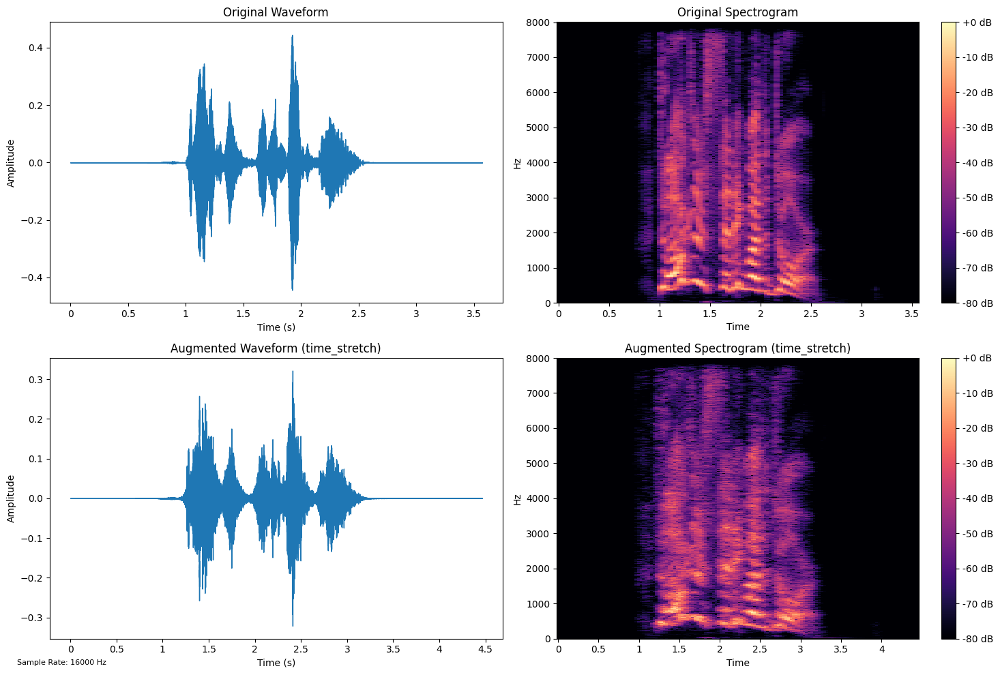


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 4.46 seconds

Augmentation Parameters:
rate: 0.8

Emotion: happy, Rate: 0.9


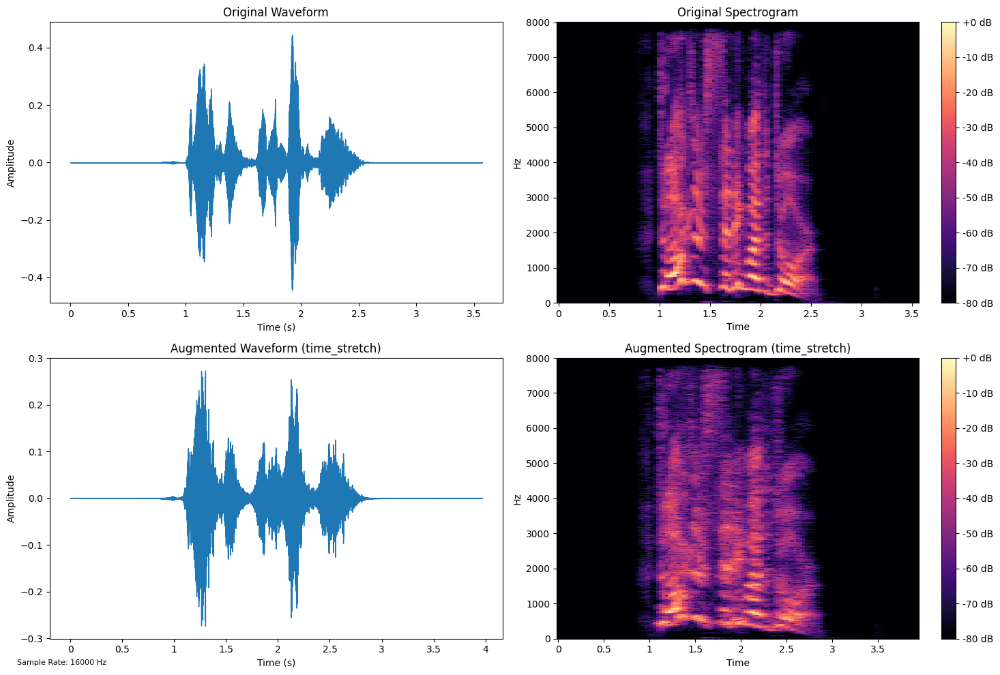


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.97 seconds

Augmentation Parameters:
rate: 0.9

Emotion: happy, Rate: 1.0


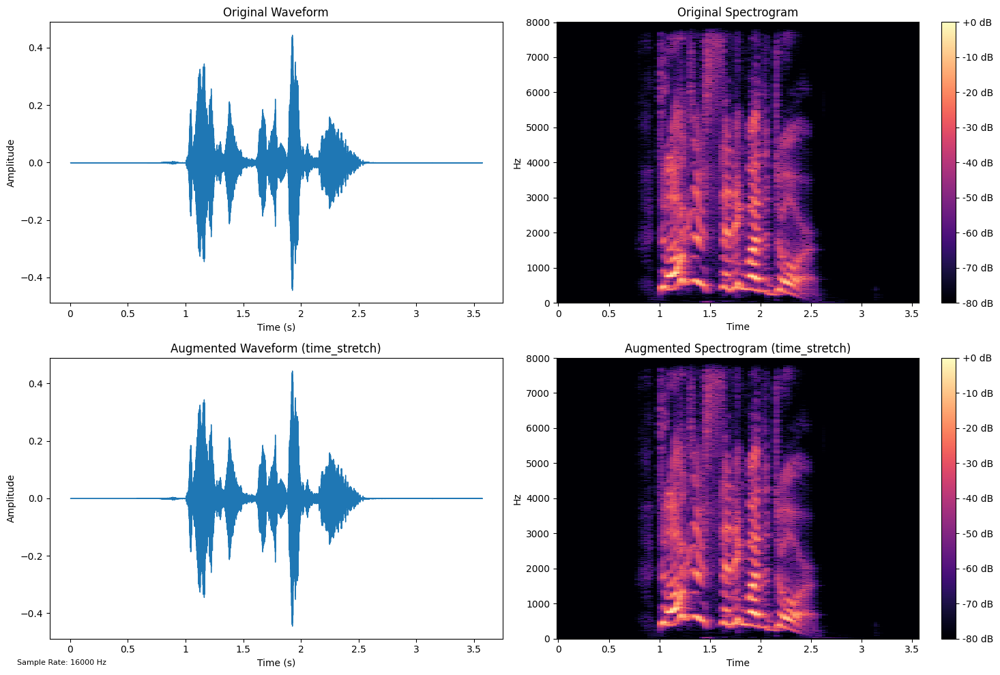


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
rate: 1.0

Emotion: happy, Rate: 1.1


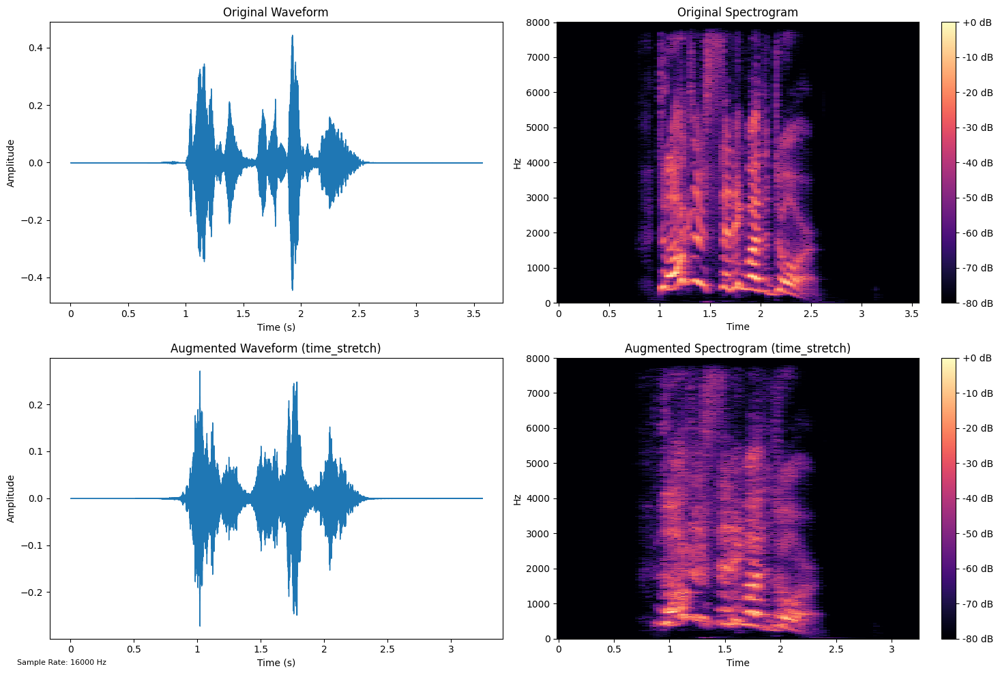


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.25 seconds

Augmentation Parameters:
rate: 1.1

Emotion: happy, Rate: 1.2


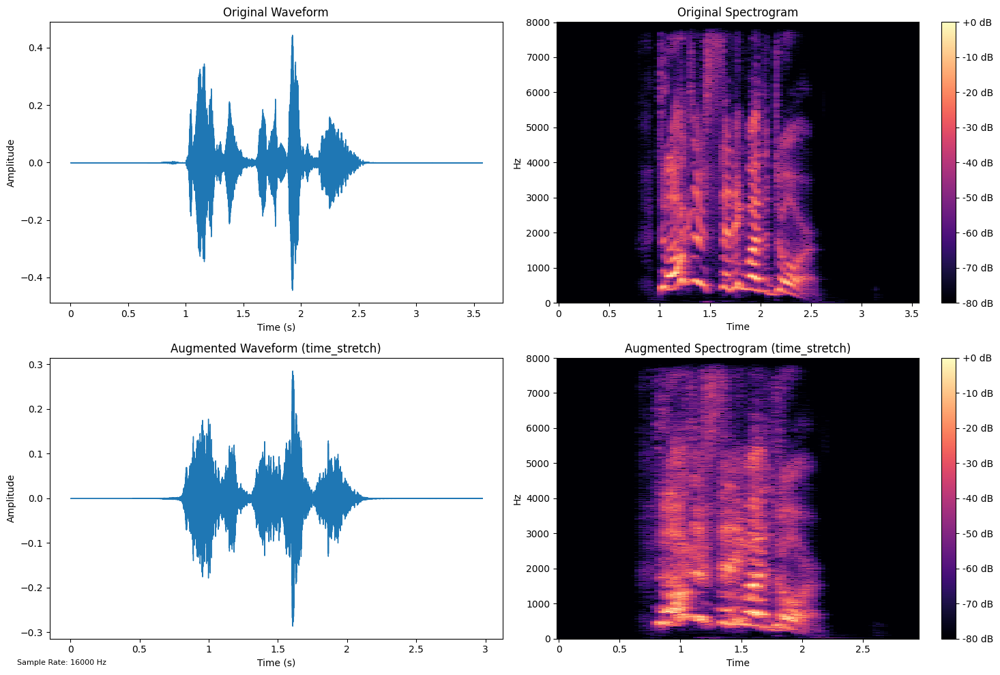


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 2.98 seconds

Augmentation Parameters:
rate: 1.2

=== Testing Noise Addition Augmentation ===

Emotion: happy, Noise Level: 0.001


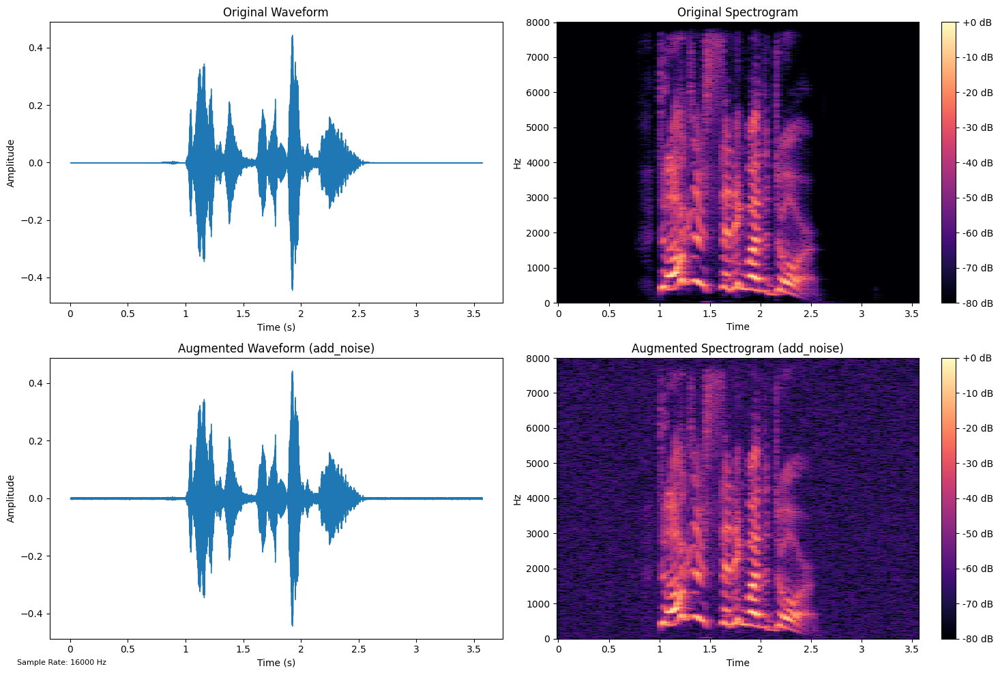


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
noise_level: 0.001

Emotion: happy, Noise Level: 0.005


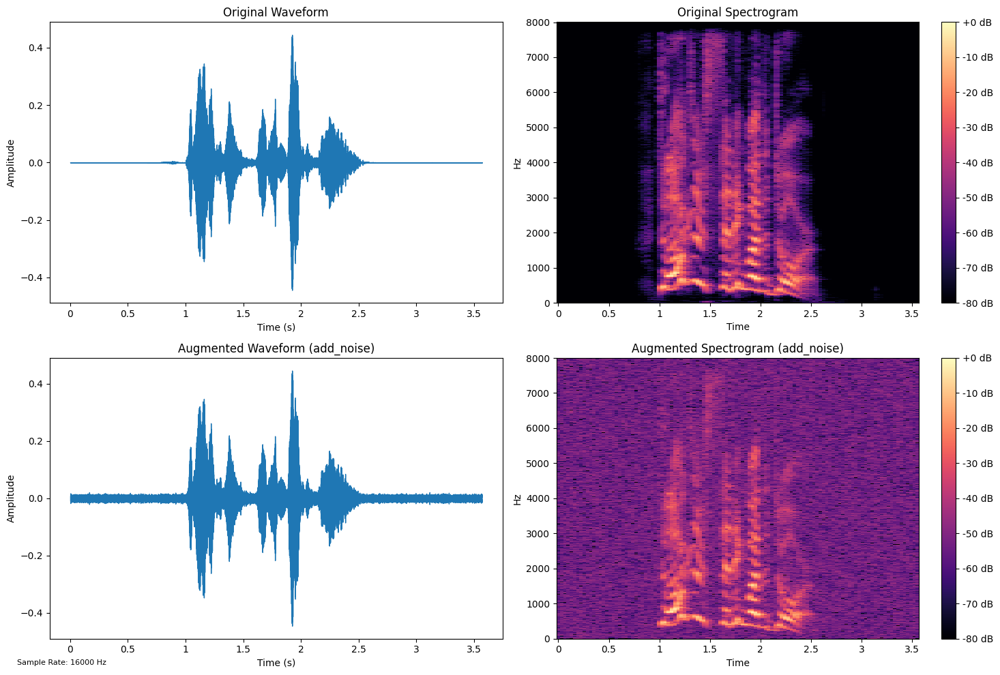


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
noise_level: 0.005

Emotion: happy, Noise Level: 0.01


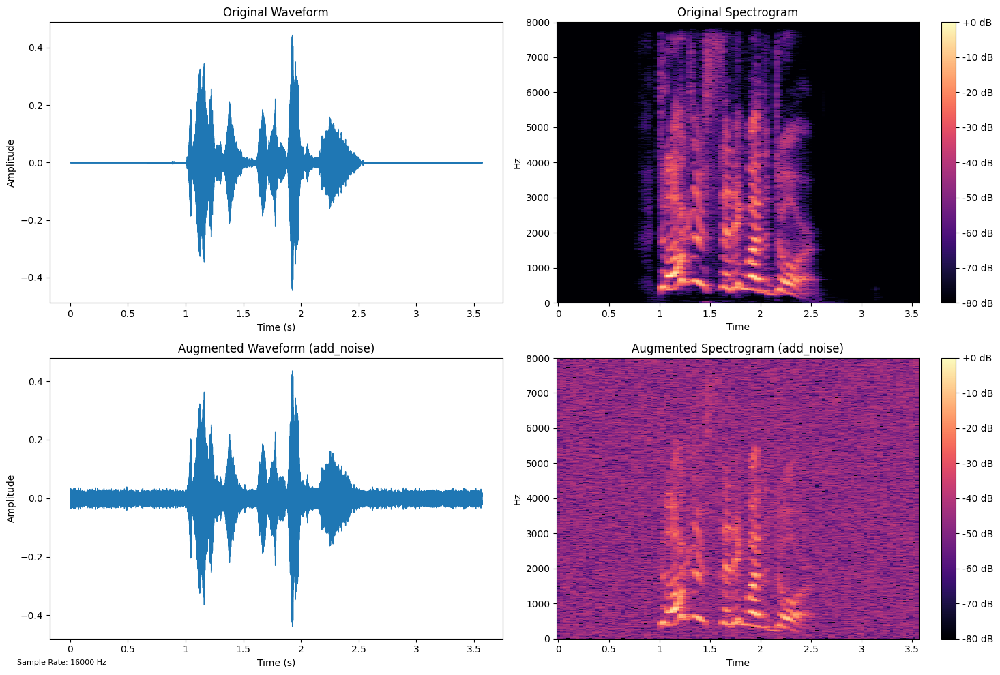


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
noise_level: 0.01

=== Testing SpecAugment ===

Emotion: happy, Time Mask: 10, Freq Mask: 10


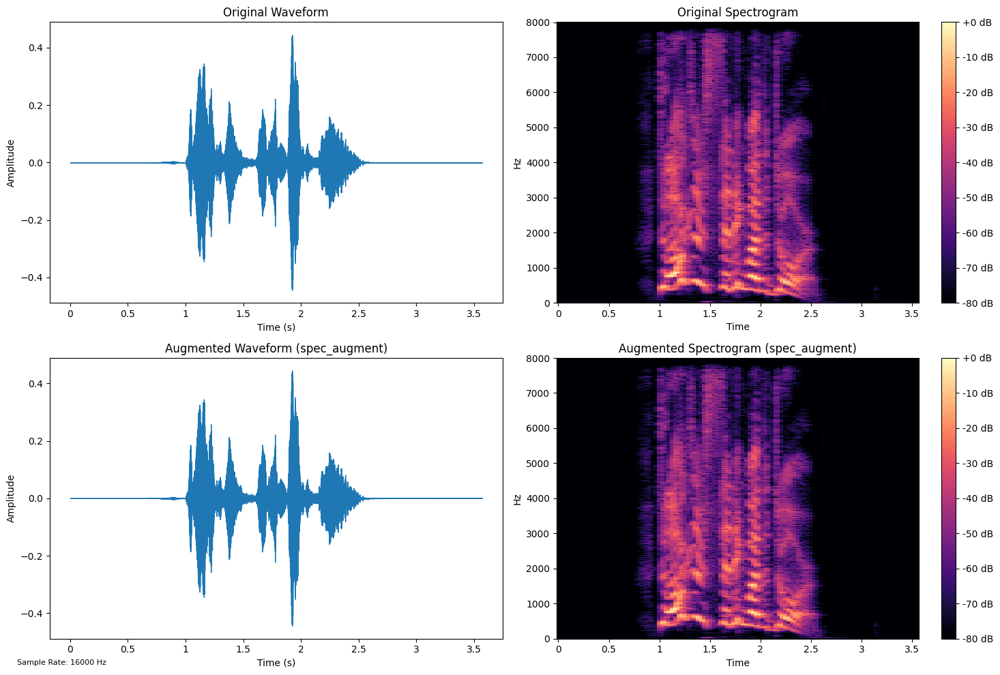


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
time_mask_param: 10
freq_mask_param: 10

Emotion: happy, Time Mask: 20, Freq Mask: 20


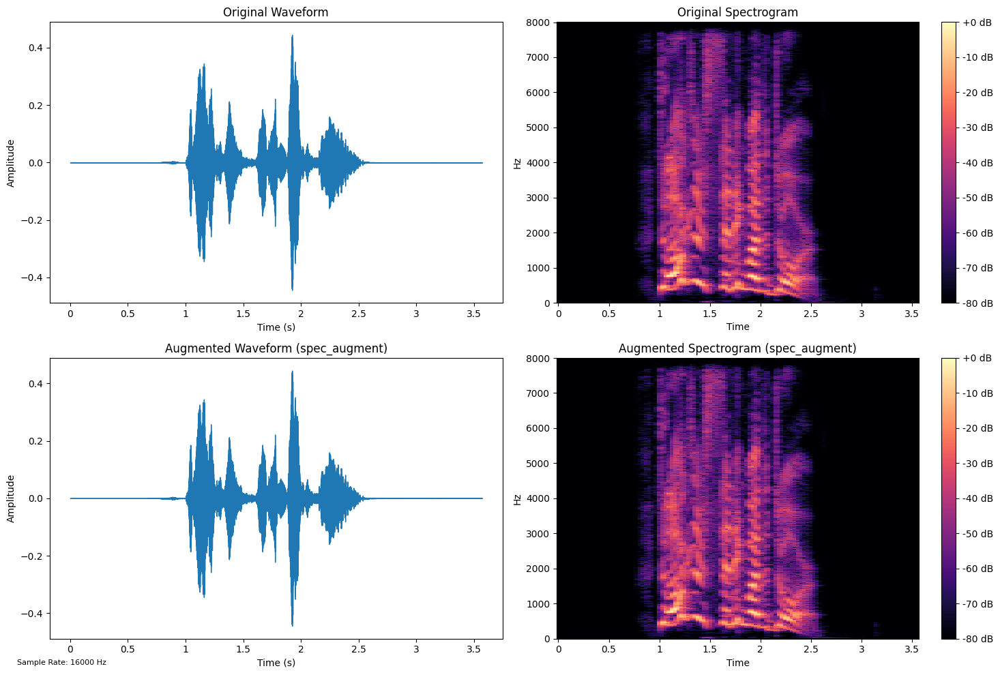


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
time_mask_param: 20
freq_mask_param: 20

Emotion: happy, Time Mask: 30, Freq Mask: 30


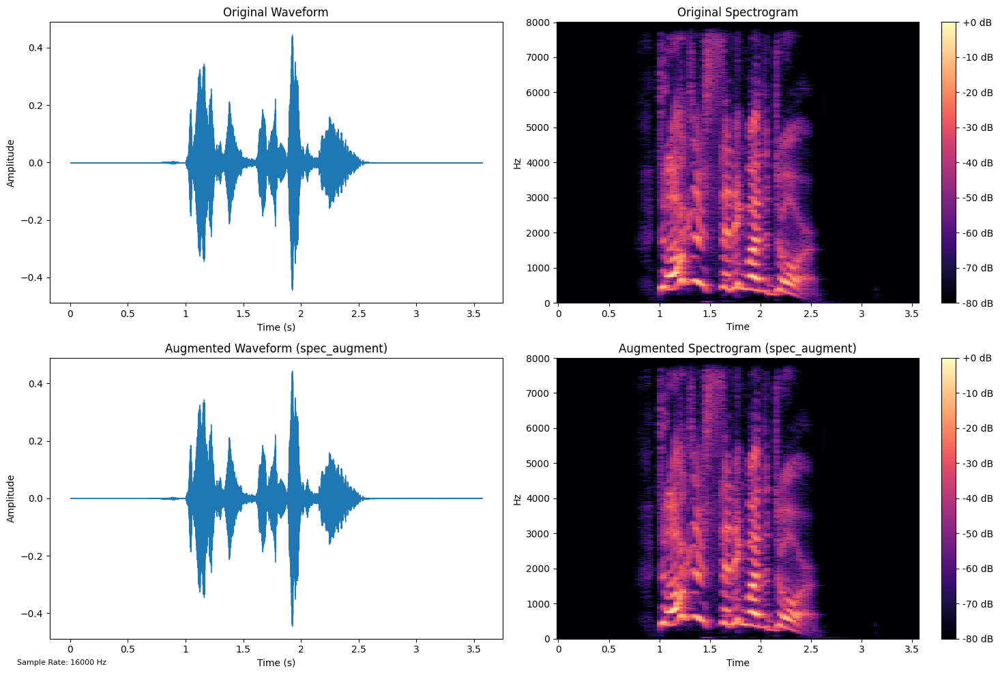


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
time_mask_param: 30
freq_mask_param: 30

=== Augmentation Testing Summary ===


,,mean,std,count
augmentation,emotion,,,
add_noise,happy,1.731274,0.028486,3
spec_augment,happy,1.615044,0.027390,3
time_stretch,happy,1.766120,0.163714,5


  emotion  augmentation parameters  duration
0   happy  time_stretch   rate=0.8  1.699792
1   happy  time_stretch   rate=0.9  1.765780
2   happy  time_stretch   rate=1.0  2.047626
3   happy  time_stretch   rate=1.1  1.643115
4   happy  time_stretch   rate=1.2  1.674289


In [ ]:
results = test_augmentation_parameters(
    train_df,
    emotions=['happy']
)

# The results DataFrame contains timing and parameter information
print(results.head())

### Apply augmentation to data frames

First method is with 1:1 ratio as for each sample in the source set will be the input for the augmentation method and its augmented version will be created using a sampled paras.

In [ ]:
import os

def create_augmented_df_sample(df: pd.DataFrame, aug_type: str, split: str) -> pd.DataFrame:
    """
    Creates augmented version of dataset using specified augmentation with sampled parameters

    Args:
        df: Original dataframe with [gender, emotion, labels, source, path]
        aug_type: One of ['time_stretch', 'add_noise', 'spec_augment']
        split: Either 'train' or 'test' to separate storage

    Returns:
        DataFrame with augmented samples (1:1 with original)
    """
    # Create directory if it doesn't exist
    save_dir = f"augmented/{split}/{aug_type}"
    os.makedirs(save_dir, exist_ok=True)

    augmented_rows = []

    for idx, row in df.iterrows():
        # Load audio
        audio, sr = librosa.load(row['path'], sr=16000)

        # Sample parameters based on augmentation type
        if aug_type == 'time_stretch':
            param = np.random.choice(param_values["time_stretch"])
            aug_audio = time_stretch(audio, rate=param)
            param_str = f"rate{param}"

        elif aug_type == 'add_noise':
            param = np.random.choice(param_values["add_noise"])
            aug_audio = add_noise(audio, noise_level=param)
            param_str = f"noise{param}"

        elif aug_type == 'spec_augment':
            time_mask = np.random.choice(param_values["spec_augment"]["time_mask_param"])
            freq_mask = np.random.choice(param_values["spec_augment"]["freq_mask_param"])
            aug_audio = spec_augment(audio, sr, time_mask_param=time_mask, freq_mask_param=freq_mask)
            param = {'time_mask': time_mask, 'freq_mask': freq_mask}
            param_str = f"time{time_mask}_freq{freq_mask}"

        # Save augmented audio
        aug_path = os.path.join(save_dir, f"{idx}_{param_str}_{row['emotion']}.wav")
        sf.write(aug_path, aug_audio, sr)

        # Create new row
        new_row = {
            'gender': row['gender'],
            'emotion': row['emotion'],
            'labels': row['labels'],
            'source': row['source'],
            'path': aug_path,
            'aug_type': aug_type,
            'aug_params': param
        }
        augmented_rows.append(new_row)

    return pd.DataFrame(augmented_rows)

Creation of 1:1 train and test sets

In [ ]:
# For train set
train_spec_df = create_augmented_df_sample(train_df, 'spec_augment', 'train')

# For test set
test_spec_df = create_augmented_df_sample(test_df, 'spec_augment', 'test')

In [ ]:
# First, add augmentation info to original dataframes
train_df['aug_type'] = 'clean'
train_df['aug_params'] = None

test_df['aug_type'] = 'clean'
test_df['aug_params'] = None

In [ ]:
# For training set
train_combined_spec = pd.concat([train_df, train_spec_df], ignore_index=True)

# For test set
test_combined_spec = pd.concat([test_df, test_spec_df], ignore_index=True)

print("Training sets:")
print(f"Original: {len(train_df)}")
print(f"Noisy combined: {len(test_combined_spec)}")
print(test_df.head())

Training sets:
Original: 998
Noisy combined: 500
      gender  emotion  labels   source  \
379     male     fear       6  RAVDESS   
1111    male  neutral       1  RAVDESS   
938   female  disgust       7  RAVDESS   
1039  female      sad       4  RAVDESS   
908   female    happy       3  RAVDESS   

                                                   path aug_type aug_params  
379   ./Audio_Speech_Actors_01-24/Actor_07/03-01-06-...    clean       None  
1111  ./Audio_Speech_Actors_01-24/Actor_19/03-01-01-...    clean       None  
938   ./Audio_Speech_Actors_01-24/Actor_16/03-01-07-...    clean       None  
1039  ./Audio_Speech_Actors_01-24/Actor_18/03-01-04-...    clean       None  
908   ./Audio_Speech_Actors_01-24/Actor_16/03-01-03-...    clean       None  


### 2.4 Tokenization

Prepare audio processing and encoding

In [ ]:
def map_to_array(example):
   speech, _ = librosa.load(example["path"], sr=16000, mono=True)
   example["speech"] = speech
   return example

train_data = Dataset.from_pandas(train_combined_spec).map(map_to_array)
test_data = Dataset.from_pandas(test_df).map(map_to_array)

feature_extractor = Wav2Vec2FeatureExtractor.from_pretrained("superb/hubert-large-superb-er")

train_encodings = feature_extractor(list(train_data["speech"]), sampling_rate=16000, padding=True, return_tensors="pt")
test_encodings = feature_extractor(list(test_data["speech"]), sampling_rate=16000, padding=True, return_tensors="pt")

Map:   0%|          | 0/1996 [00:00<?, ? examples/s]

Map:   0%|          | 0/250 [00:00<?, ? examples/s]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/212 [00:00<?, ?B/s]

### 2.5 Turn data into a Dataset object

Define a Dataset class.

In [ ]:
# Dataset class
class EmotionDataset(torch.utils.data.Dataset):
   def __init__(self, encodings, labels):
       self.encodings = encodings
       pattern = {
           1: 0,  # neutral
           2: 0,  # neutral
           3: 1,  # happy
           4: 2,  # sad
           5: 3,  # angry
           6: 4,  # fear
           7: 5,  # disgust
           8: 6   # surprise
       }
       self.labels = [pattern[x] for x in labels]

   def __getitem__(self, idx):
       item = {key: val[idx] for key, val in self.encodings.items()}
       item['labels'] = torch.tensor(self.labels[idx])
       return item

   def __len__(self):
       return len(self.labels)

train_dataset = EmotionDataset(train_encodings, list(train_data["labels"]))
test_dataset = EmotionDataset(test_encodings, list(test_data["labels"]))

In [ ]:
print(train_dataset)
print(test_dataset)

## 4. Loading the Model and Optimizer

In [ ]:
# Loading the model
model = HubertForSequenceClassification.from_pretrained(
   "superb/hubert-large-superb-er",
   num_labels=7,
   ignore_mismatched_sizes=True
)
model.to(device)

# Loading the optimizer
optim = AdamW(model.parameters(), lr=1e-5)

config.json:   0%|          | 0.00/1.83k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

Some weights of HubertForSequenceClassification were not initialized from the model checkpoint at superb/hubert-large-superb-er and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([4, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- classifier.bias: found shape torch.Size([4]) in the checkpoint and torch.Size([7]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
model

HubertForSequenceClassification(
  (hubert): HubertModel(
    (feature_extractor): HubertFeatureEncoder(
      (conv_layers): ModuleList(
        (0): HubertLayerNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (1-4): 4 x HubertLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (5-6): 2 x HubertLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): HubertFeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (pro

In [ ]:
# Right now, all the parameters are trainable
for name, param in model.named_parameters():
    print(name, param.requires_grad)

layer_weights True
hubert.masked_spec_embed True
hubert.feature_extractor.conv_layers.0.conv.weight True
hubert.feature_extractor.conv_layers.0.conv.bias True
hubert.feature_extractor.conv_layers.0.layer_norm.weight True
hubert.feature_extractor.conv_layers.0.layer_norm.bias True
hubert.feature_extractor.conv_layers.1.conv.weight True
hubert.feature_extractor.conv_layers.1.conv.bias True
hubert.feature_extractor.conv_layers.1.layer_norm.weight True
hubert.feature_extractor.conv_layers.1.layer_norm.bias True
hubert.feature_extractor.conv_layers.2.conv.weight True
hubert.feature_extractor.conv_layers.2.conv.bias True
hubert.feature_extractor.conv_layers.2.layer_norm.weight True
hubert.feature_extractor.conv_layers.2.layer_norm.bias True
hubert.feature_extractor.conv_layers.3.conv.weight True
hubert.feature_extractor.conv_layers.3.conv.bias True
hubert.feature_extractor.conv_layers.3.layer_norm.weight True
hubert.feature_extractor.conv_layers.3.layer_norm.bias True
hubert.feature_extracto

## 5. Training

Prediction function - using softmax for multiclassification task.

In [ ]:
# Prediction function
def predict(outputs):
   probabilities = torch.softmax(outputs["logits"], dim=1)
   predictions = torch.argmax(probabilities, dim=1)
   return predictions

Train the augmented model.

In [ ]:
# Training

from torch.utils.data import DataLoader

# Training
epoch = 7
batch_size = 8
train_loss = []
train_accuracies = []

model.train()
for epoch_i in range(epoch):
   print(f'Epoch {epoch_i + 1}/{epoch}')
   time.sleep(0.3)

   train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
   correct = 0
   count = 0
   epoch_loss = []

   pbar = tqdm(train_loader)
   for batch in pbar:
       optim.zero_grad()
       input_ids = batch['input_values'].to(device)
       attention_mask = batch['attention_mask'].to(device)
       labels = batch['labels'].to(device)
       outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
       loss = outputs['loss']
       loss.backward()
       optim.step()

       predictions = predict(outputs)
       correct += predictions.eq(labels).sum().item()
       count += len(labels)
       accuracy = correct / count

       pbar.set_postfix({
           'Loss': f'{loss.item():.3f}',
           'Accuracy': f'{accuracy:.3f}'
       })
       epoch_loss.append(loss.item())

   pbar.close()
   train_loss += epoch_loss
   train_accuracies.append(accuracy)

Epoch 1/7


100%|██████████| 250/250 [06:25<00:00,  1.54s/it, Loss=1.675, Accuracy=0.291]


Epoch 2/7


100%|██████████| 250/250 [06:28<00:00,  1.55s/it, Loss=0.846, Accuracy=0.578]


Epoch 3/7


100%|██████████| 250/250 [06:30<00:00,  1.56s/it, Loss=0.430, Accuracy=0.737]


Epoch 4/7


100%|██████████| 250/250 [06:32<00:00,  1.57s/it, Loss=0.481, Accuracy=0.813]


Epoch 5/7


100%|██████████| 250/250 [06:28<00:00,  1.55s/it, Loss=0.048, Accuracy=0.843]


Epoch 6/7


100%|██████████| 250/250 [06:29<00:00,  1.56s/it, Loss=0.555, Accuracy=0.876]


Epoch 7/7


100%|██████████| 250/250 [06:30<00:00,  1.56s/it, Loss=0.754, Accuracy=0.911]


**Visualise train process**

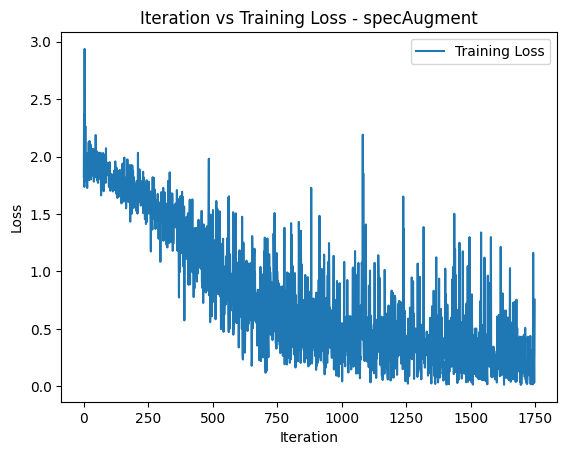

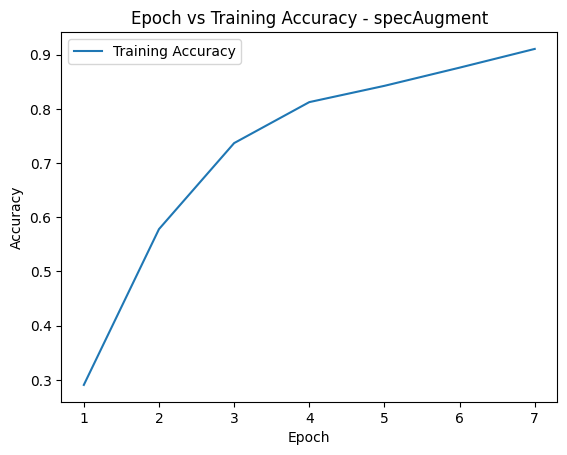

In [ ]:
# Plot Iteration vs Training Loss
plt.plot(train_loss, label="Training Loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("Iteration vs Training Loss - specAugment")
plt.legend()
plt.show()

# Plot Epoch vs Training Accuracy
acc_X = np.arange(len(train_accuracies))+1
plt.plot(acc_X, train_accuracies,"-", label="Training Accuracy")
plt.xticks(acc_X)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Epoch vs Training Accuracy - specAugment")
plt.legend()
plt.show()

**Save model**

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
# Save model and feature extractor to Drive
save_path = f"{BASE_DIR}/Augmented models/specAugment"
model.save_pretrained(save_path)
feature_extractor.save_pretrained(save_path)

# Verify the save was successful
import os
saved_files = os.listdir(save_path)
print("Saved files:", saved_files)

Mounted at /content/drive
Saved files: ['config.json', 'model.safetensors', 'preprocessor_config.json']


## 5. Testing

### **Testing on clean Test Set**

**Retrieve predictions**

In [ ]:
# Testing
from torch.utils.data import DataLoader

# Get test data by DataLoader
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Start testing
# model.eval()
model.eval()

with torch.no_grad():
   correct = 0
   count = 0
   record = {"labels":[], "predictions":[]}

   pbar = tqdm(test_loader)
   for batch in pbar:
       input_ids = batch['input_values'].to(device)
       attention_mask = batch['attention_mask'].to(device)
       labels = batch['labels'].to(device)
       #outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
       outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
       loss = outputs['loss']

       predictions = predict(outputs)
       correct += predictions.eq(labels).sum().item()
       count += len(labels)
       accuracy = correct / count

       pbar.set_postfix({
           'loss': f'{loss.item():.3f}',
           'accuracy': f'{accuracy:.3f}'
       })

       record["labels"] += labels.cpu().numpy().tolist()
       record["predictions"] += predictions.cpu().numpy().tolist()

   pbar.close()

print(f"\nFinal test accuracy: {accuracy*100:.4f}%")

100%|██████████| 250/250 [00:22<00:00, 10.93it/s, loss=1.272, accuracy=0.872]


Final test accuracy: 87.2000%


**Analysis of the results**

In [ ]:
# Analysis
df_record = pd.DataFrame(record)
df_record.columns = ["Ground Truth", "Model Prediction"]

emotions = ["neutral", "happy", "sad", "angry", "fear", "disgust", "surprise"]
df_record["Ground Truth"] = df_record["Ground Truth"].apply(lambda x: emotions[x])
df_record["Model Prediction"] = df_record["Model Prediction"].apply(lambda x: emotions[x])

In [ ]:
# Concat test texts and test records
df = pd.concat([test_df.reset_index(), df_record["Model Prediction"]], axis=1)
#df["emotion"] = df.apply(lambda x: x["emotion"][:3], axis=1)

# Show incorrect predictions
incorrect_predictions = df[df["emotion"] != df["Model Prediction"]]
incorrect_predictions.head(10)

,index,gender,emotion,labels,source,path,aug_type,aug_params,Model Prediction
7,1437,female,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-08-...,clean,None,happy
17,57,male,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...,clean,None,neutral
23,25,male,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...,clean,None,neutral
31,847,male,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_15/03-01-04-...,clean,None,happy
39,765,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_13/03-01-08-...,clean,None,happy
60,995,male,angry,5,RAVDESS,./Audio_Speech_Actors_01-24/Actor_17/03-01-05-...,clean,None,sad
63,645,male,happy,3,RAVDESS,./Audio_Speech_Actors_01-24/Actor_11/03-01-03-...,clean,None,neutral
65,499,male,disgust,7,RAVDESS,./Audio_Speech_Actors_01-24/Actor_09/03-01-07-...,clean,None,sad
73,1225,male,happy,3,RAVDESS,./Audio_Speech_Actors_01-24/Actor_21/03-01-03-...,clean,None,neutral
94,883,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_15/03-01-08-...,clean,None,disgust


**Lets look at incorrect predictions**

In [ ]:
samples = incorrect_predictions.sample(n=3, random_state=42)
# Loop through the selected samples and display information
for idx, row in samples.iterrows():
    print(f"Sample {idx}:")
    print(f"True Emotion: {row['emotion']}")
    print(f"Predicted Emotion: {row['Model Prediction']}")
    print("Audio:")
    ipd.display(ipd.Audio(data=row["path"], autoplay=False, rate=16000))
    print("-" * 50)

Sample 210:
True Emotion: happy
Predicted Emotion: angry
Audio:


--------------------------------------------------
Sample 229:
True Emotion: fear
Predicted Emotion: surprise
Audio:


--------------------------------------------------
Sample 11:
True Emotion: happy
Predicted Emotion: surprise
Audio:


--------------------------------------------------


**Classification report**

In [ ]:
print("\nClassification Report on clean data - Noise:")
report = classification_report(
    df_record["Ground Truth"],
    df_record["Model Prediction"],
    target_names=emotions
)
print(report)


Classification Report on clean data - Noise:
              precision    recall  f1-score   support

     neutral       1.00      0.89      0.94        38
       happy       0.92      0.92      0.92        38
         sad       0.93      1.00      0.96        39
       angry       0.81      0.77      0.79        39
        fear       0.58      0.95      0.72        19
     disgust       0.88      0.74      0.81        39
    surprise       0.94      0.87      0.90        38

    accuracy                           0.87       250
   macro avg       0.87      0.88      0.86       250
weighted avg       0.89      0.87      0.87       250



**Confusion Matrix**

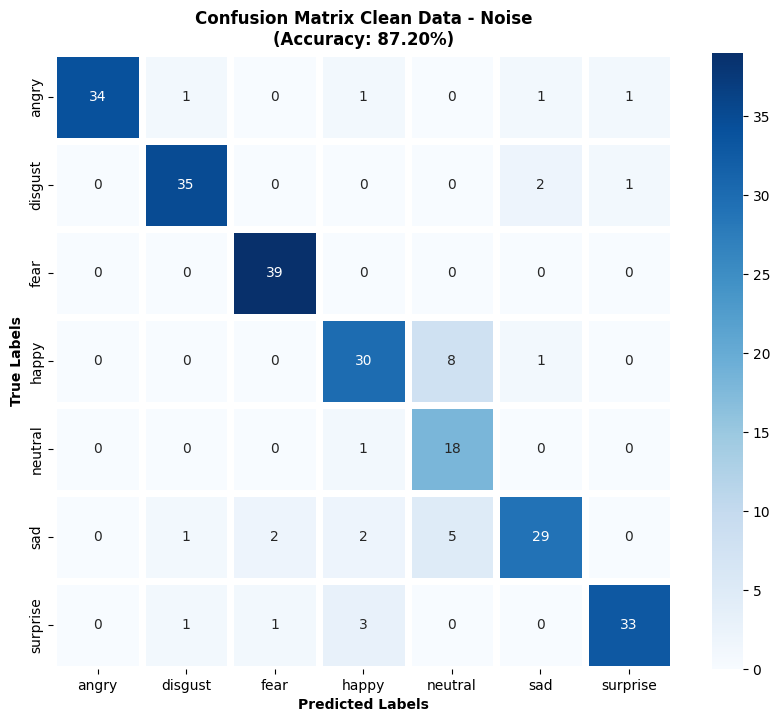

In [ ]:
# Confusion Matrix
crosstab = pd.crosstab(df_record["Ground Truth"], df_record["Model Prediction"])
plt.figure(figsize=(10, 8))
sns.heatmap(crosstab, cmap='Blues', annot=True, fmt='g', linewidths=5)
accuracy = df_record["Ground Truth"].eq(df_record["Model Prediction"]).sum() / len(df_record)
plt.title(f"Confusion Matrix Clean Data - Noise\n(Accuracy: {accuracy*100:.2f}%)", fontweight='bold')
plt.ylabel("True Labels", fontweight='bold')
plt.xlabel("Predicted Labels", fontweight='bold')
plt.show()

### **Testing on Augmented Test Set**



=== Testing on Augmented Test Set ===



Map:   0%|          | 0/250 [00:00<?, ? examples/s]

100%|██████████| 250/250 [00:23<00:00, 10.86it/s, loss=1.408, accuracy=0.876]


Final augmented test accuracy: 87.6000%

Incorrect predictions for augmented test set:
    index  gender   emotion  labels   source  \
7       7  female  surprise       8  RAVDESS   
17     17    male       sad       4  RAVDESS   
23     23    male       sad       4  RAVDESS   
31     31    male       sad       4  RAVDESS   
39     39    male  surprise       8  RAVDESS   
60     60    male     angry       5  RAVDESS   
63     63    male     happy       3  RAVDESS   
65     65    male   disgust       7  RAVDESS   
73     73    male     happy       3  RAVDESS   
94     94    male  surprise       8  RAVDESS   

                                                 path      aug_type  \
7   augmented/test/spec_augment/1437_time10_freq30...  spec_augment   
17  augmented/test/spec_augment/57_time30_freq30_s...  spec_augment   
23  augmented/test/spec_augment/25_time30_freq30_s...  spec_augment   
31  augmented/test/spec_augment/847_time30_freq30_...  spec_augment   
39  augmented/test/spec_augme

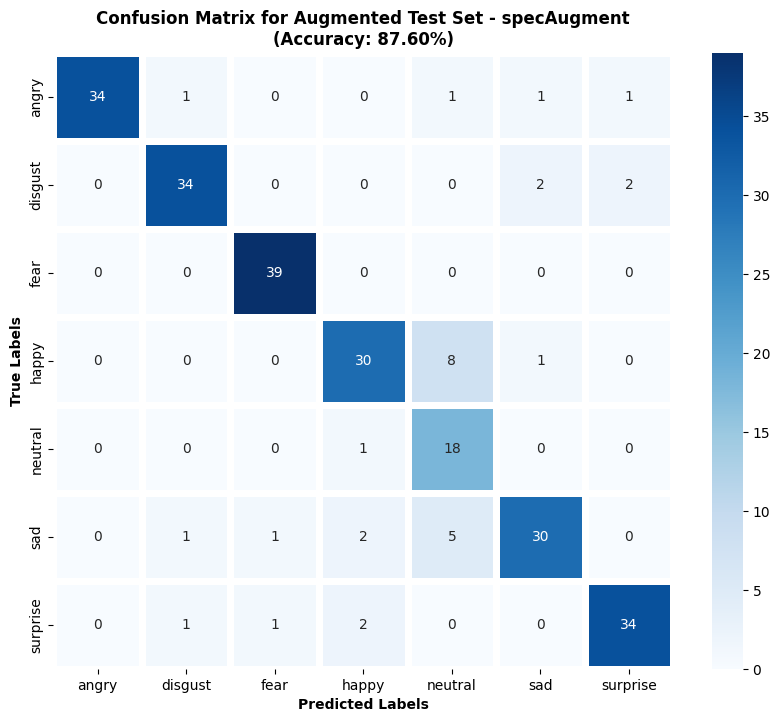

In [ ]:
print("\n=== Testing on Augmented Test Set ===\n")

# Get augmented test data by DataLoader
test_data_aug = Dataset.from_pandas(test_spec_df).map(map_to_array)
test_aug_encodings = feature_extractor(list(test_data_aug["speech"]), sampling_rate=16000, padding=True, return_tensors="pt")
test_dataset_aug = EmotionDataset(test_aug_encodings, list(test_data_aug["labels"]))
test_loader_aug = DataLoader(test_dataset_aug, batch_size=1, shuffle=False)

# Start testing on augmented data
model.eval()

with torch.no_grad():
    correct = 0
    count = 0
    record = {"labels":[], "predictions":[]}

    pbar = tqdm(test_loader_aug)
    for batch in pbar:
        input_ids = batch['input_values'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs['loss']

        predictions = predict(outputs)
        correct += predictions.eq(labels).sum().item()
        count += len(labels)
        accuracy = correct / count

        pbar.set_postfix({
            'loss': f'{loss.item():.3f}',
            'accuracy': f'{accuracy:.3f}'
        })

        record["labels"] += labels.cpu().numpy().tolist()
        record["predictions"] += predictions.cpu().numpy().tolist()

    pbar.close()

print(f"Final augmented test accuracy: {accuracy*100:.4f}%")

# Analysis for augmented test set
df_record_aug = pd.DataFrame(record)
df_record_aug.columns = ["Ground Truth", "Model Prediction"]

df_record_aug["Ground Truth"] = df_record_aug["Ground Truth"].apply(lambda x: emotions[x])
df_record_aug["Model Prediction"] = df_record_aug["Model Prediction"].apply(lambda x: emotions[x])

# Concat test texts and test records for augmented data
df_aug = pd.concat([test_spec_df.reset_index(), df_record_aug["Model Prediction"]], axis=1)

# Show incorrect predictions for augmented data
incorrect_predictions_aug = df_aug[df_aug["emotion"] != df_aug["Model Prediction"]]
print("\nIncorrect predictions for augmented test set:")
print(incorrect_predictions_aug.head(10))

print("\nClassification Report for Augmented Test Set:")
report_aug = classification_report(
    df_record_aug["Ground Truth"],
    df_record_aug["Model Prediction"],
    target_names=emotions
)
print(report_aug)

# Confusion Matrix for augmented test set
plt.figure(figsize=(10, 8))
crosstab_aug = pd.crosstab(df_record_aug["Ground Truth"], df_record_aug["Model Prediction"])
sns.heatmap(crosstab_aug, cmap='Blues', annot=True, fmt='g', linewidths=5)
accuracy_aug = df_record_aug["Ground Truth"].eq(df_record_aug["Model Prediction"]).sum() / len(df_record_aug)
plt.title(f"Confusion Matrix for Augmented Test Set - specAugment\n(Accuracy: {accuracy_aug*100:.2f}%)", fontweight='bold')
plt.ylabel("True Labels", fontweight='bold')
plt.xlabel("Predicted Labels", fontweight='bold')
plt.show()

### **Testing on Clean + Augmented Test Set**


=== Testing on Clean + Augmented Test Set ===



Map:   0%|          | 0/500 [00:00<?, ? examples/s]

100%|██████████| 500/500 [00:45<00:00, 10.88it/s, loss=1.408, accuracy=0.874]


Final augmented test accuracy: 87.4000%

Incorrect predictions for augmented test set:
    index  gender   emotion  labels   source  \
7       7  female  surprise       8  RAVDESS   
17     17    male       sad       4  RAVDESS   
23     23    male       sad       4  RAVDESS   
31     31    male       sad       4  RAVDESS   
39     39    male  surprise       8  RAVDESS   
60     60    male     angry       5  RAVDESS   
63     63    male     happy       3  RAVDESS   
65     65    male   disgust       7  RAVDESS   
73     73    male     happy       3  RAVDESS   
94     94    male  surprise       8  RAVDESS   

                                                 path aug_type aug_params  \
7   ./Audio_Speech_Actors_01-24/Actor_24/03-01-08-...    clean       None   
17  ./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...    clean       None   
23  ./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...    clean       None   
31  ./Audio_Speech_Actors_01-24/Actor_15/03-01-04-...    clean       None   

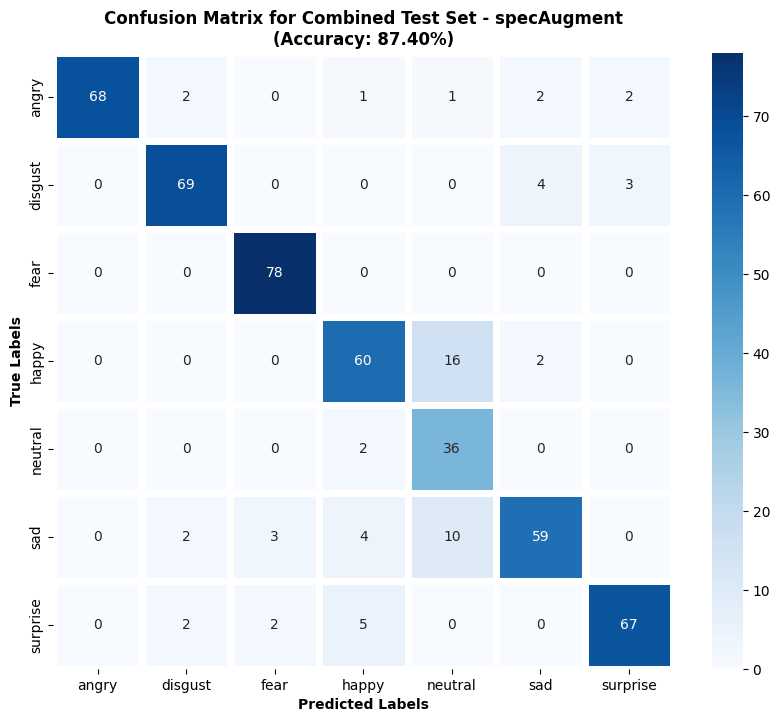

In [ ]:
print("\n=== Testing on Clean + Augmented Test Set ===\n")

# Get augmented test data by DataLoader
test_data_aug = Dataset.from_pandas(test_combined_spec).map(map_to_array)
test_aug_encodings = feature_extractor(list(test_data_aug["speech"]), sampling_rate=16000, padding=True, return_tensors="pt")
test_dataset_aug = EmotionDataset(test_aug_encodings, list(test_data_aug["labels"]))
test_loader_aug = DataLoader(test_dataset_aug, batch_size=1, shuffle=False)

# Start testing on augmented data
model.eval()

with torch.no_grad():
    correct = 0
    count = 0
    record = {"labels":[], "predictions":[]}

    pbar = tqdm(test_loader_aug)
    for batch in pbar:
        input_ids = batch['input_values'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs['loss']

        predictions = predict(outputs)
        correct += predictions.eq(labels).sum().item()
        count += len(labels)
        accuracy = correct / count

        pbar.set_postfix({
            'loss': f'{loss.item():.3f}',
            'accuracy': f'{accuracy:.3f}'
        })

        record["labels"] += labels.cpu().numpy().tolist()
        record["predictions"] += predictions.cpu().numpy().tolist()

    pbar.close()

print(f"Final augmented test accuracy: {accuracy*100:.4f}%")

# Analysis for augmented test set
df_record_aug = pd.DataFrame(record)
df_record_aug.columns = ["Ground Truth", "Model Prediction"]

df_record_aug["Ground Truth"] = df_record_aug["Ground Truth"].apply(lambda x: emotions[x])
df_record_aug["Model Prediction"] = df_record_aug["Model Prediction"].apply(lambda x: emotions[x])

# Concat test texts and test records for augmented data
df_aug = pd.concat([test_combined_spec.reset_index(), df_record_aug["Model Prediction"]], axis=1)

# Show incorrect predictions for augmented data
incorrect_predictions_aug = df_aug[df_aug["emotion"] != df_aug["Model Prediction"]]
print("\nIncorrect predictions for augmented test set:")
print(incorrect_predictions_aug.head(10))

print("\nClassification Report for Combined Test Set - specAugment:")
report_aug = classification_report(
    df_record_aug["Ground Truth"],
    df_record_aug["Model Prediction"],
    target_names=emotions
)
print(report_aug)

# Confusion Matrix for augmented test set
plt.figure(figsize=(10, 8))
crosstab_aug = pd.crosstab(df_record_aug["Ground Truth"], df_record_aug["Model Prediction"])
sns.heatmap(crosstab_aug, cmap='Blues', annot=True, fmt='g', linewidths=5)
accuracy_aug = df_record_aug["Ground Truth"].eq(df_record_aug["Model Prediction"]).sum() / len(df_record_aug)
plt.title(f"Confusion Matrix for Combined Test Set - specAugment\n(Accuracy: {accuracy_aug*100:.2f}%)", fontweight='bold')
plt.ylabel("True Labels", fontweight='bold')
plt.xlabel("Predicted Labels", fontweight='bold')
plt.show()

## Testing all test sets

Load the specAugmented model

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
# Load model and feature extractor from the saved path
model_path = f"{BASE_DIR}/Augmented models/specAugment"
model = HubertForSequenceClassification.from_pretrained(model_path)
feature_extractor = Wav2Vec2FeatureExtractor.from_pretrained(model_path)
model.to(device)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


HubertForSequenceClassification(
  (hubert): HubertModel(
    (feature_extractor): HubertFeatureEncoder(
      (conv_layers): ModuleList(
        (0): HubertLayerNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (1-4): 4 x HubertLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (5-6): 2 x HubertLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): HubertFeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (pro

Load the test sets

In [ ]:
import os
import shutil
import pandas as pd
import pickle

def load_test_sets(base_dir='test_sets_backup'):
    """
    Loads all saved test sets and restores original naming with spaces.
    """
    loaded_sets = {}

    # Go through each folder in the base directory
    for set_folder in os.listdir(base_dir):
        if os.path.isdir(os.path.join(base_dir, set_folder)):
            # Load the DataFrame
            df_path = os.path.join(base_dir, set_folder, 'metadata.pkl')
            if os.path.exists(df_path):
                # Convert folder name back to original format (replace underscores with spaces)
                original_name = set_folder.replace('_', ' ')
                loaded_sets[original_name] = pd.read_pickle(df_path)

    return loaded_sets

In [ ]:
# Load all test sets
loaded_test_sets = load_test_sets(f"{BASE_DIR}/Datasets/RAVDNESS")

# Select only relevant test sets for noise model
noise_relevant_sets = {
    'Clean': loaded_test_sets['Clean'],
    'SpecAugment': loaded_test_sets['SpecAugment'],
    'Combined SpecAugment': loaded_test_sets['Combined SpecAugment']
}

**Function to test a single test set**

In [ ]:
def evaluate_test_set(model, test_df, set_name, device, feature_extractor):
    """
    Evaluates model performance on a given test set and generates analysis

    Args:
        model: The trained model
        test_df: DataFrame containing test data
        set_name: String identifying the test set (e.g., 'Noise', 'Time Stretch')
        emotions: List of emotion labels
        device: torch device
        feature_extractor: HuBERT feature extractor
    """
    # Ensure model is in eval mode and gradients are disabled
    model.eval()
    for param in model.parameters():
        param.requires_grad = False

    # Prepare data
    test_data = Dataset.from_pandas(test_df).map(map_to_array)
    test_encodings = feature_extractor(
        list(test_data["speech"]),
        sampling_rate=16000,
        padding=True,
        return_tensors="pt"
    )
    test_dataset = EmotionDataset(test_encodings, list(test_data["labels"]))
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    # Testing loop
    with torch.no_grad():
        correct = 0
        count = 0
        record = {"labels": [], "predictions": []}

        pbar = tqdm(test_loader, desc=f"Testing {set_name}")
        for batch in pbar:
            input_ids = batch['input_values'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)

            predictions = predict(outputs)
            correct += predictions.eq(labels).sum().item()
            count += len(labels)
            accuracy = correct / count

            pbar.set_postfix({
                'loss': f'{outputs["loss"].item():.3f}',
                'accuracy': f'{accuracy:.3f}'
            })

            record["labels"] += labels.cpu().numpy().tolist()
            record["predictions"] += predictions.cpu().numpy().tolist()

        pbar.close()

    # Analysis
    df_record = pd.DataFrame(record)
    df_record.columns = ["Ground Truth", "Model Prediction"]
    emotions = ["neutral", "happy", "sad", "angry", "fear", "disgust", "surprise"]
    df_record["Ground Truth"] = df_record["Ground Truth"].apply(lambda x: emotions[x])
    df_record["Model Prediction"] = df_record["Model Prediction"].apply(lambda x: emotions[x])

    # Results printing
    print(f"\n=== Results for {set_name} ===")
    print(f"Final accuracy: {accuracy*100:.4f}%")

    # Classification report
    print(f"\nClassification Report for specAugment model on {set_name} test set:")
    report = classification_report(
        df_record["Ground Truth"],
        df_record["Model Prediction"],
        target_names=emotions
    )
    print(report)

    # Confusion Matrix
    plt.figure(figsize=(10, 8))
    crosstab = pd.crosstab(df_record["Ground Truth"], df_record["Model Prediction"])
    sns.heatmap(crosstab, cmap='Blues', annot=True, fmt='g', linewidths=5)
    plt.title(f"Confusion Matrix for specAugment model - {set_name} test set\n(Accuracy: {accuracy*100:.2f}%)",
              fontweight='bold')
    plt.ylabel("True Labels", fontweight='bold')
    plt.xlabel("Predicted Labels", fontweight='bold')
    plt.show()

    return accuracy, df_record

**All test datasets saved**


Evaluating specAugment Model on Clean dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Clean: 100%|██████████| 250/250 [00:21<00:00, 11.50it/s, loss=1.314, accuracy=0.908]



=== Results for Clean ===
Final accuracy: 90.8000%

Classification Report for specAugment model on Clean test set:
              precision    recall  f1-score   support

     neutral       0.97      0.92      0.95        38
       happy       1.00      0.89      0.94        38
         sad       0.97      1.00      0.99        39
       angry       0.85      0.90      0.88        39
        fear       0.64      0.95      0.77        19
     disgust       0.94      0.85      0.89        39
    surprise       0.92      0.87      0.89        38

    accuracy                           0.91       250
   macro avg       0.90      0.91      0.90       250
weighted avg       0.92      0.91      0.91       250



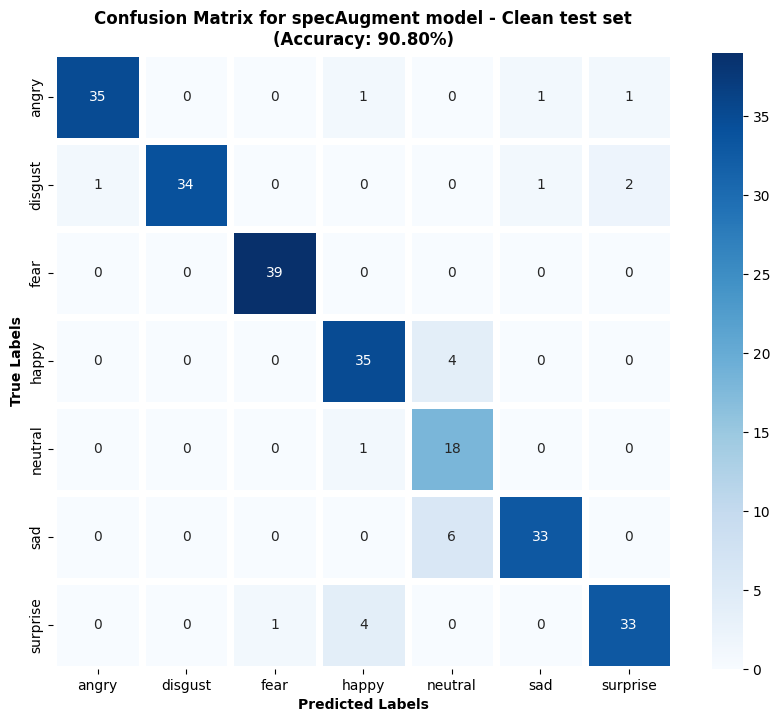


Evaluating specAugment Model on SpecAugment dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing SpecAugment: 100%|██████████| 250/250 [00:21<00:00, 11.45it/s, loss=1.636, accuracy=0.912]



=== Results for SpecAugment ===
Final accuracy: 91.2000%

Classification Report for specAugment model on SpecAugment test set:
              precision    recall  f1-score   support

     neutral       1.00      0.92      0.96        38
       happy       1.00      0.89      0.94        38
         sad       0.97      1.00      0.99        39
       angry       0.87      0.87      0.87        39
        fear       0.64      0.95      0.77        19
     disgust       0.94      0.87      0.91        39
    surprise       0.89      0.89      0.89        38

    accuracy                           0.91       250
   macro avg       0.90      0.91      0.90       250
weighted avg       0.92      0.91      0.91       250



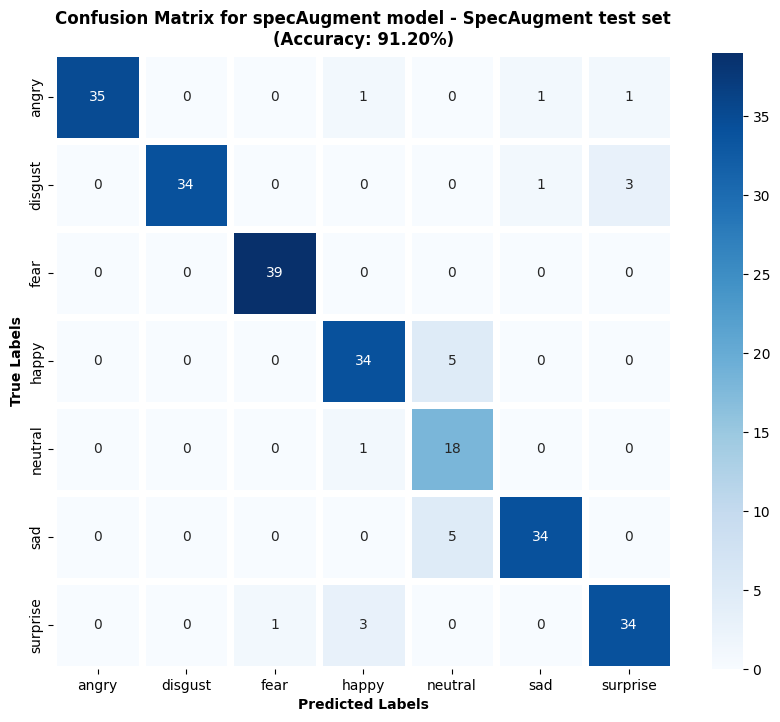


Evaluating specAugment Model on Combined SpecAugment dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined SpecAugment: 100%|██████████| 500/500 [00:44<00:00, 11.24it/s, loss=1.636, accuracy=0.910]



=== Results for Combined SpecAugment ===
Final accuracy: 91.0000%

Classification Report for specAugment model on Combined SpecAugment test set:
              precision    recall  f1-score   support

     neutral       0.99      0.92      0.95        76
       happy       1.00      0.89      0.94        76
         sad       0.97      1.00      0.99        78
       angry       0.86      0.88      0.87        78
        fear       0.64      0.95      0.77        38
     disgust       0.94      0.86      0.90        78
    surprise       0.91      0.88      0.89        76

    accuracy                           0.91       500
   macro avg       0.90      0.91      0.90       500
weighted avg       0.92      0.91      0.91       500



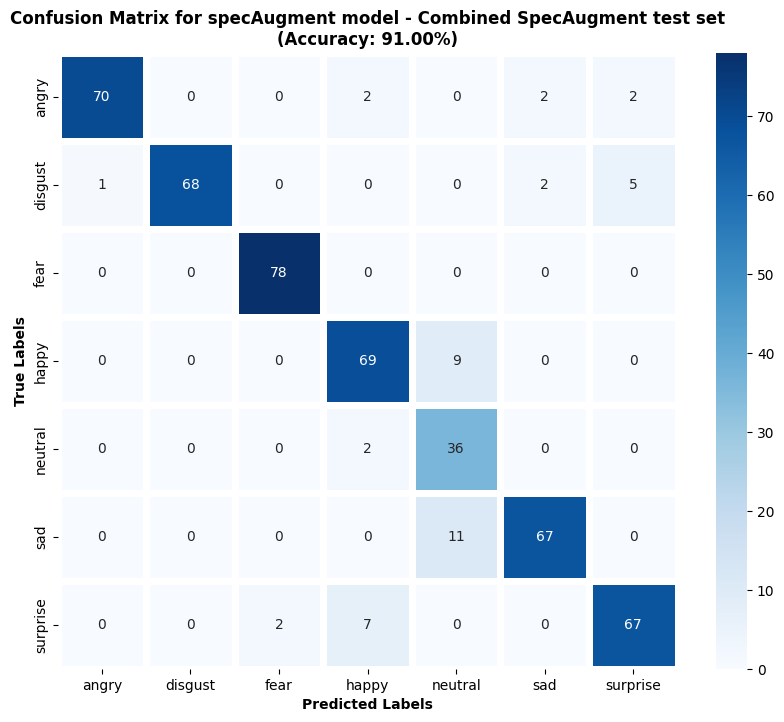

In [ ]:
# Evaluate noise model only on relevant sets
results = {}
for set_name, test_data in noise_relevant_sets.items():
    print(f"\nEvaluating specAugment Model on {set_name} dataset...")
    accuracy, df_record = evaluate_test_set(
        model,
        test_data,
        set_name,
        device,
        feature_extractor
    )
    results[set_name] = {'accuracy': accuracy, 'record': df_record}